In [1]:
import json
import base64

# Load from a JSON file
with open("logos_dict.json", "r") as json_file:
    loaded_encoded_logos_dict = json.load(json_file)

# Decode the image data back to binary
decoded_logos_dict = {domain: base64.b64decode(img_bytes) for domain, img_bytes in loaded_encoded_logos_dict.items()}

In [2]:
from PIL import Image
import io

# Function to check if the binary data is a valid image
def is_valid_image(img_bytes):
    try:
        # Try to open the binary data as an image
        img = Image.open(io.BytesIO(img_bytes))
        img.verify()  # Verify the image file integrity
        return True
    except Exception:
        return False

# Filter decoded_logos_dict to keep only valid images
filtered_logos_dict = {
    domain: img_bytes
    for domain, img_bytes in decoded_logos_dict.items()
    if img_bytes is not None and is_valid_image(img_bytes)
}

print(f"Prior total number of logos: {len(decoded_logos_dict)}")
print(f"Number of filtered logos: {len(filtered_logos_dict)}")

Prior total number of logos: 3360
Number of filtered logos: 3336


In [3]:
import numpy as np
import cv2
from PIL import Image, UnidentifiedImageError
from io import BytesIO

def extract_color_histogram(image_bytes):
    # Open the image from bytes
    image = Image.open(BytesIO(image_bytes)).convert("RGB")
    image_np = np.array(image)

    # Convert to OpenCV format (BGR)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)

    # Convert to HSV for better white detection
    hsv = cv2.cvtColor(image_np, cv2.COLOR_BGR2HSV)

    # Define a mask to remove white pixels (high saturation means non-white)
    lower_white = np.array([0, 0, 200], dtype=np.uint8)  # Lower bound for white
    upper_white = np.array([180, 50, 255], dtype=np.uint8)  # Upper bound for white

    mask = cv2.inRange(hsv, lower_white, upper_white)
    mask_inv = cv2.bitwise_not(mask)  # Invert mask to keep non-white pixels

    # Apply mask to each channel
    b, g, r = cv2.split(image_np)
    r = r[mask_inv > 0]
    g = g[mask_inv > 0]
    b = b[mask_inv > 0]

    # Compute histograms for non-background pixels
    hist_r = cv2.calcHist([r], [0], None, [256], [0, 256]).flatten()
    hist_g = cv2.calcHist([g], [0], None, [256], [0, 256]).flatten()
    hist_b = cv2.calcHist([b], [0], None, [256], [0, 256]).flatten()

    # Normalize histograms
    hist_r /= hist_r.sum() if hist_r.sum() > 0 else 1
    hist_g /= hist_g.sum() if hist_g.sum() > 0 else 1
    hist_b /= hist_b.sum() if hist_b.sum() > 0 else 1

    return np.concatenate([hist_r, hist_g, hist_b])  # Combine all histograms

# Loop through each image in logos_dict and extract color histograms
color_histograms_dict = {}
for domain, image_bytes in filtered_logos_dict.items():
    if image_bytes:
        try:
            # Try to extract and store color histogram
            color_histograms_dict[domain] = extract_color_histogram(image_bytes)
        except (UnidentifiedImageError, ValueError) as e:
            # Skip the domain if an error occurs
            color_histograms_dict[domain] = None
    else:
        color_histograms_dict[domain] = None  # No image found for this domain

C:\Users\maria\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\PIL\Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [5]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Threshold for similarity
similarity_threshold = 0.99

# Grouping logic
groups = []
processed = set()

for domain1, hist1 in color_histograms_dict.items():
    if domain1 in processed:
        continue
    current_group = [domain1]
    processed.add(domain1)
    
    for domain2, hist2 in color_histograms_dict.items():
        if domain2 not in processed:
            # Compute cosine similarity
            similarity = cosine_similarity([hist1], [hist2])[0][0]
            if similarity >= similarity_threshold:
                current_group.append(domain2)
                processed.add(domain2)
    
    groups.append(current_group)

print(f"Number of groups: {len(groups)}")

Number of groups: 1889


In [6]:
# Save the similarity matrix to a JSON file
with open("fast_result.json", "w") as json_file:
    json.dump(groups, json_file)

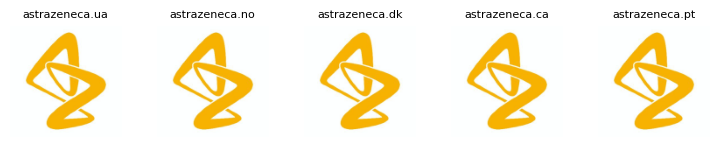

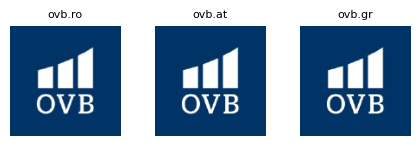

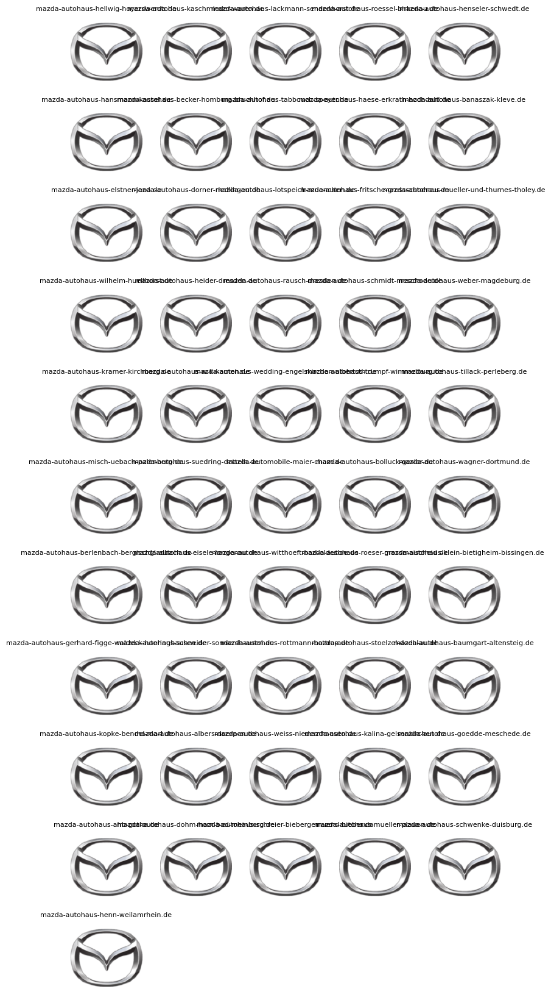

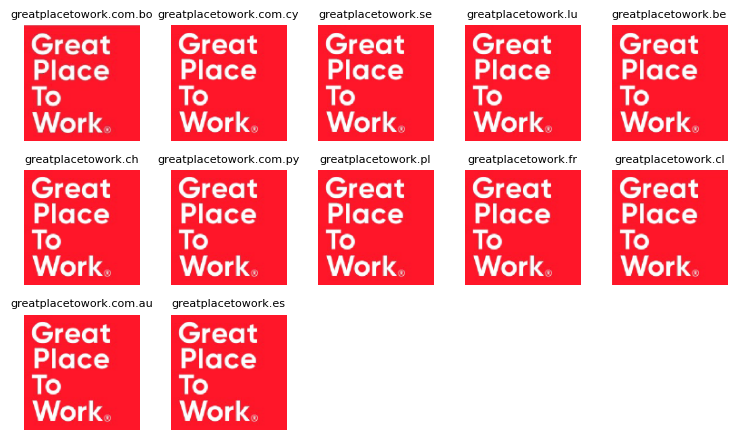

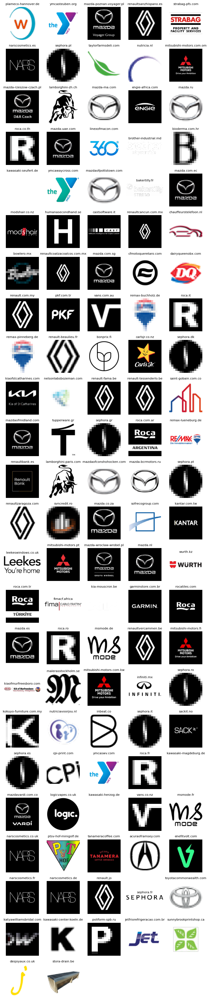

...

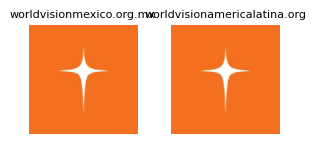

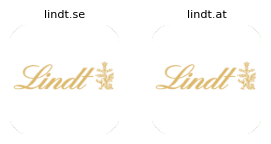

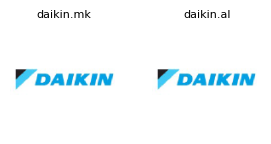

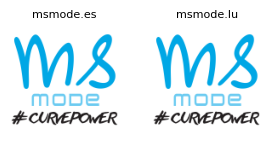

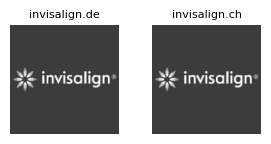

In [7]:
import matplotlib.pyplot as plt
from PIL import Image
import io
import math

# Function to convert image bytes to a PIL image
def bytes_to_image(img_bytes):
    return Image.open(io.BytesIO(img_bytes))

# Filter groups with at least 2 domains
filtered_groups = [domains for domains in groups if len(domains) >= 2]

# Loop through groups to display images dynamically
for domains in filtered_groups:
    num_images = len(domains)
    
    # Dynamically calculate rows and columns for the grid layout
    cols = min(5, num_images)  # Limit the number of columns to 5 for readability
    rows = math.ceil(num_images / cols)  # Calculate the required rows
    
    # Adjust figure size dynamically
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.5, rows * 1.5))  # Adjust size per image
    axes = axes.ravel() if num_images > 1 else [axes]  # Flatten axes if needed

    for i, domain in enumerate(domains):
        img = bytes_to_image(filtered_logos_dict[domain])  # Convert image bytes to PIL image
        axes[i].imshow(img)
        axes[i].set_title(domain, fontsize=8)
        axes[i].axis('off')  # Turn off axes

    # Turn off unused axes if fewer images than grid spaces
    for j in range(len(domains), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()